# Road Marking Monitoring for Smart Cities

The basic aim of this project is to find out the Roadcrossing around the cities from the Aerial Images

# DATA 

For the Pedestrain crossing Detection Problem we are using Image Data  that is available via the open map service https://kartta.hel.fi.

## Fetching the Data

A Web Map Service (WMS) is a standard protocol developed by the Open Geospatial Consortium in 1999 for serving georeferenced map images over the Internet.from The WMS interface for Map we downlaod the images over varoius geographical coordinates.

In [5]:
##let's read the image data from wms api

from owslib.wms import WebMapService
import os

In [6]:
wms = WebMapService('https://kartat.espoo.fi/teklaogcweb/wms.ashx?request=GetCapabilities', version='1.1.1')

In [11]:
## more data
import numpy as np
minX=25480209.71
minY=6669590.42
maxX=25482545.80
maxY=6674345.35
min_x_cord=[]
max_x_cord=[]
min_y_cord=[]
max_y_cord=[]
img_name=[]
a=np.linspace(minX,maxX,16)
b=np.linspace(minY,maxY,16)
counter=1161
imgpath=DIR
image_files=[f for f in os.listdir(imgpath)]



In [ ]:
##Creating patches for the image
for i in range(0,len(a)-1):
    for j in range(0,len(b)-1):
        image_name='outside_'+str(counter)
        if not image_files:
            img=wms.getmap(layers=["Ortokartta"],srs="EPSG:3879",bbox=(a[i],b[j],a[i+1],b[j+1]),size=(1000,800),format='image/png',transparent=True)
            out = open(DIR+image_name+'.png', 'wb')
            out.write(img.read())
            out.close()
        min_x_cord.append(a[i])
        min_y_cord.append(b[j])
        max_x_cord.append(a[i+1])
        max_y_cord.append(b[j+1])
        img_name.append(image_name)
        counter+=1

# MODEL

## Retina Net
object detection in Aerial Images is challengin and intersting problem It will be very useful to have models that can extract valuable information from Geo data. Retina Net is the most **famous single stage detector**


 
RetinaNet is a single stage detector that uses Feature Pyramid Network (FPN) and Focal loss for training.
RetinaNetis a state-of-the-art detector presented by Lin, Goyal et al. in2017. In order to understand what RetinaNet is and does we
can decompose this nework in 3 parts:
<p>a) A backbone network built on top of ResNet called ”Feature
Pyramid Net” and is what computes the convolutional feature
maps of an entire image.</p>
<p>b) A subnetwork that uses the backbone’s output to perform
the object classification.</p>
<p>c) A subnetwork that uses the backbone’s output and is
responsible for performing the bounding box.</p>





- Feature pyramid network is a structure for multiscale object detectiont 
- It combines low-resolution, semantically strong features with high-resolution, semantically weak features via a top-down pathway and lateral connections. 
- The net result is that it produces feature maps of different scale on multiple levels in the network which helps with both classifier and regressor networks.



- The Focal Loss is designed to address the single-stage object detection problems.
- with the imbalance where there is a very large number of possible background classes and just a few foreground classes.
- Easily classified negatives comprise the majority of the loss and dominate the gradient. 
- While alpha balances the importance of positive/negative examples, it does not differentiate between easy/hard examples. So the authors have reshaped the cross entropy function and come up with focal loss as mentioned below
\begin{equation}
F L(p t)=-\left(1-p_{t}\right)^{Y} * \alpha_{t} * \log (p t)
\end{equation}
- Focal loss add very less weight to well classified examples and large weight to miss-classified or hard classified examples

<p>Here gamma is called the focusing param and alpha is called the balancing param.</p>
gamma =2 and alpha =0.25 works best and in general alpha should be decreased slightly as gamma is increased.

## Training a RetinaNet in Keras

Before starting Training the Model on your own dataset first of all some of the Steps need to be carried out
- Creating the Annotations
- Anchor optimization
- Debugging

### Creating The Annotations

We start by creating annotations for the training and validation dataset, using the tool LabelImg. This excellent annotation tool let you quickly annotate the bounding boxes of the objects to train the machine learning model. https://github.com/tzutalin/labelImg 


### Annotations format

The CSV file with annotations should contain one annotation per line. Images with multiple bounding boxes should use one row per bounding box. Note that indexing for pixel values starts at 0. The expected format of each line is:

path/to/image.jpg,x1,y1,x2,y2,class_name


In [3]:
import xml.etree.ElementTree as ET
import os
import numpy as np
import keras
import math
import tensorflow as tf
import cv2
from os import listdir, walk
from os.path import join
from keras_retinanet.bin.train import create_generators,create_models,create_callbacks
from keras_retinanet.models import backbone,load_model,convert_model
from keras_retinanet.utils.config import read_config_file,parse_anchor_parameters
from keras_retinanet.utils.visualization import draw_boxes
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa

tf.set_random_seed(31) # SEEDS MAKE RESULTS MORE REPRODUCABLE
np.random.seed(17)

import os
import shutil
import zipfile
import urllib
import xml.etree.ElementTree as ET
import numpy as np
import csv
import pandas as pd

Using TensorFlow backend.
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/bhuwan/anaconda3/

# Load and Convert Annotations

Here we load annotations given in PASCAL VOC Format and save them in CSV Format as required by keras-retinanet package

In [6]:


classes = ['n','c']



In [7]:
def create_annotation(image_id,filename):
    in_file = open('/home/bhuwan/Desktop/roadcross_detection/training/annots_/%s.xml'%(image_id))
    out_file = open(filename, 'a')
    tree=ET.parse(in_file)
    root = tree.getroot()
    
    if root.iter('object') is not None:
        for obj in root.iter('object'):
            cls = obj.find('name').text
            if cls not in classes:
                continue
            cls_id = classes.index(cls)
            
            xmlbox = obj.find('bndbox')
            x1 = math.ceil(float(xmlbox.find('xmin').text))
            y1 = math.ceil(float(xmlbox.find('ymin').text))
            x2 = math.ceil(float(xmlbox.find('xmax').text))
            y2 = math.ceil(float(xmlbox.find('ymax').text))
            if x1 == x2 or y1 == y2:
                continue
                
            out_file.write(f'/home/bhuwan/Desktop/roadcross_detection/training/images/{image_id}.png,{x1},{y1},{x2},{y2},{cls}\n')
    else:
        out_file.write(f'/home/bhuwan/Desktop/roadcross_detection/training/images/{image_id}.png,,,,,\n')

##  Training and Validation split

Normally we would have 10-30% of our images in validation set but as we want best possible score we'll use almost all our images to train, as we have quite few training images already. 

In [8]:
_,_,image_ids = next(walk('/home/bhuwan/Desktop/roadcross_detection/training/images/'))
image_ids = [i[:-4] for i in image_ids]
open('annotations.csv','w')
open('val_annotations.csv','w')

train_ids,val_ids = train_test_split(image_ids,random_state=31,test_size=0.1)

for image_id in train_ids:
    create_annotation(image_id,'annotations.csv')
        
for image_id in val_ids:
    create_annotation(image_id,'val_annotations.csv')
    
print(len(train_ids),len(val_ids))

2226 248


## Anchor Boxes and optimization 

- Anchor boxes were first introduced in Faster RCNN paper and later became a common element in all the following papers like yolov2, ssd and RetinaNet. 
- Previously selective search and edge boxes used to generate region proposals of various sizes and shapes depending on the objects in the image, with standard convolutions
- it is highly impossible to generate region proposals of varied shapes, so anchor boxes comes to our rescue.
- When you use a neural network like YOLO or SDD to predict multiple objects in a picture, the network is actually making thousands of predictions and only showing the ones that it decided were an object. 
- Prediction 1: (X, Y, Height, Width), Class
….
- Prediction ~80,000: (X, Y, Height, Width), Class

- Where the(X, Y, Height, Width) is called the “bounding box”,

1. Anchor parameters are used to decide how anchor boxes will be generated for the model.
1. As we're dealing mostly small boxes with can be highly elongated, we'll change ratios and scales to fit our needs.


In [ ]:
!python /home/bhuwan/Desktop/retina-net/anchor-optimization-master/optimize_anchors.py "/home/bhuwan/Desktop/roadcross_detection/annotations.csv" --ratios=5 --include-stride

## Debugging

Creating your own dataset does not always work out of the box. There is a debug.py tool to help find the most common mistakes.

- Particularly helpful is the --annotations flag which displays your annotations on the images from your dataset.  - Annotations are colored in green when there are anchors available and colored in red when there are no anchors available. 
- If an annotation doesn't have anchors available, it means it won't contribute to training. 
- It is normal for a small amount of annotations to show up in red
- if most or all annotations are red there is cause for concern. 
- The most common issues are that the annotations are too small or too oddly shaped (stretched out).


In [8]:
! python keras-retinanet/keras_retinanet/bin/debug.py  --display-name --random-transform --annotations csv annotations.csv  classes.csv  

Using TensorFlow backend.
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/bhuwan/anaconda3/

# Some Hyperparameters for Training the Model



In [15]:
b = backbone('resnet50') #we are using resnet50 as backbone we can change to 101

class args:
    batch_size = 8
    config = read_config_file('config.ini')
    random_transform = True # Image augmentation
    annotations = 'annotations.csv'
    val_annotations = 'val_annotations.csv'
    classes = 'classes.csv'
    image_min_side = 1000
    image_max_side = 1000
    dataset_type = 'csv'
    tensorboard_dir = ''
    evaluation = False
    snapshots = True
    snapshot_path = "saved/"
    backbone = 'resnet50'
    epochs = 150
    steps = len(train_ids)//(batch_size)
    weighted_average = True

In [16]:
train_gen,valid_gen = create_generators(args,b.preprocess_image) #create a generator

In [17]:
train_gen.size(),valid_gen.size()

(2226, 248)

# Image Augmentation

 we'll use a package called imgaug to furthur augment the data.
 https://imgaug.readthedocs.io/en/latest/source/examples_basics.html#heavy-augmentations>


In [18]:


sometimes = lambda aug: iaa.Sometimes(0.5, aug)
# Define our sequence of augmentation steps that will be applied to every image.
seq = iaa.Sequential(
    [
        #
        # Execute 1 to 9 of the following (less important) augmenters per
        # image. Don't execute all of them, as that would often be way too
        # strong.
        #
        iaa.SomeOf((1, 9),
            [

                        # Blur each image with varying strength using
                        # gaussian blur (sigma between 0 and .5),
                        # average/uniform blur (kernel size 1x1)
                        # median blur (kernel size 1x1).
                        iaa.OneOf([
                            iaa.GaussianBlur((0,0.5)),
                            iaa.AverageBlur(k=(1)),
                            iaa.MedianBlur(k=(1)),
                        ]),

                        # Sharpen each image, overlay the result with the original
                        # image using an alpha between 0 (no sharpening) and 1
                        # (full sharpening effect).
                        iaa.Sharpen(alpha=(0, 0.25), lightness=(0.75, 1.5)),

                        # Add gaussian noise to some images.
                        # In 50% of these cases, the noise is randomly sampled per
                        # channel and pixel.
                        # In the other 50% of all cases it is sampled once per
                        # pixel (i.e. brightness change).
                        iaa.AdditiveGaussianNoise(
                            loc=0, scale=(0.0, 0.01*255), per_channel=0.5
                        ),

                        # Either drop randomly 1 to 10% of all pixels (i.e. set
                        # them to black) or drop them on an image with 2-5% percent
                        # of the original size, leading to large dropped
                        # rectangles.
                        iaa.OneOf([
                            iaa.Dropout((0.01, 0.1), per_channel=0.5),
                            iaa.CoarseDropout(
                                (0.03, 0.15), size_percent=(0.02, 0.05),
                                per_channel=0.2
                            ),
                        ]),

                        # Add a value of -5 to 5 to each pixel.
                        iaa.Add((-5, 5), per_channel=0.5),

                        # Change brightness of images (85-115% of original value).
                        iaa.Multiply((0.85, 1.15), per_channel=0.5),

                        # Improve or worsen the contrast of images.
                        iaa.ContrastNormalization((0.75, 1.25), per_channel=0.5),

                        # Convert each image to grayscale and then overlay the
                        # result with the original with random alpha. I.e. remove
                        # colors with varying strengths.
                        iaa.Grayscale(alpha=(0.0, 0.25)),

                        # In some images distort local areas with varying strength.
                        sometimes(iaa.PiecewiseAffine(scale=(0.001, 0.01)))
                    ],
            # do all of the above augmentations in random order
            random_order=True
        )
    ],
    # do all of the above augmentations in random order
    random_order=True
)

## Custom Generator For training

In [19]:
def augment_train_gen(train_gen,visualize=False):
    
    imgs = []
    boxes = []
    targets = []
    size = train_gen.size()
    idx = 0
    while True:
        while len(imgs) < args.batch_size:
            image       = train_gen.load_image(idx % size) # to load an image
            annotations = train_gen.load_annotations(idx % size) # to load an annotations
            image,annotations = train_gen.random_transform_group_entry(image,annotations) 
            imgs.append(image)            
            boxes.append(annotations['bboxes'])
            targets.append(annotations)
            idx += 1
        if visualize:
            imgs = seq.augment_images(imgs)
            imgs = np.array(imgs)
            boxes = np.array(boxes)
            yield imgs,boxes
        else:
            imgs = seq.augment_images(imgs) # image augmentation
            imgs,targets = train_gen.preprocess_group(imgs,targets)
            imgs = train_gen.compute_inputs(imgs)
            targets = train_gen.compute_targets(imgs,targets)
            imgs = np.array(imgs)
            yield imgs,targets
        imgs = []
        boxes = []
        targets = []
        

In [34]:
def visualize(train_gen):
   
    imgs = []
    boxes = []
    size = train_gen.size()
    idx = 0
    while True:
        while len(imgs) < 64:
            image       = train_gen.load_image(idx % size)
            annotations = train_gen.load_annotations(idx % size)
            image,annotations = train_gen.random_transform_group_entry(image,annotations)
            imgs.append(image)            
            boxes.append(annotations['bboxes'])
            
            idx += 1
        
        imgs = seq.augment_images(imgs)
        imgs = np.array(imgs)
        boxes = np.array(boxes)
        yield imgs,boxes
       
        imgs = []
        boxes = []
        targets = []

# Visualize augmentations

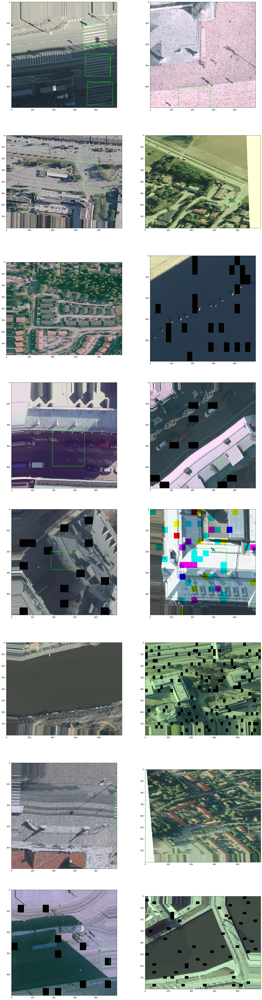

In [35]:
import matplotlib.pyplot as plt

skip_batches = 5
i = 0

for imgs,boxes in visualize(train_gen):
    #if i > skip_batches:
    fig=plt.figure(figsize=(24,96))
    columns = 2
    rows = 8
    for i in range(1, columns*rows+1 ):
        draw_boxes(imgs[i], boxes[i], (0, 255, 0), thickness=1)
        fig.add_subplot(rows, columns, i)
        plt.imshow(cv2.cvtColor(imgs[i],cv2.COLOR_BGR2RGB))
    plt.show()
    break
        
    


In [36]:
model, training_model, prediction_model = create_models(
            backbone_retinanet=b.retinanet,
            num_classes=train_gen.num_classes(),
            weights=None,
            multi_gpu=False,
            freeze_backbone=True,
            lr=1e-3,
            config=args.config
        )



tracking <tf.Variable 'Variable:0' shape=(15, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_1:0' shape=(15, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_2:0' shape=(15, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_3:0' shape=(15, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_4:0' shape=(15, 4) dtype=float32> anchors
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [37]:
callbacks = create_callbacks(
    model,
    training_model,
    prediction_model,
    valid_gen,
    args,
)

In [38]:
training_model.load_weights('resnet50_coco_best_v2.1.0.h5',skip_mismatch=True,by_name=True)

/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/keras/engine/saving.py:1319: UserWarning: Skipping loading of weights for layer regression_submodel due to mismatch in shape ((3, 3, 256, 60) vs (36, 256, 3, 3)).
  weight_values[i].shape))
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/keras/engine/saving.py:1319: UserWarning: Skipping loading of weights for layer regression_submodel due to mismatch in shape ((60,) vs (36,)).
  weight_values[i].shape))
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/keras/engine/saving.py:1319: UserWarning: Skipping loading of weights for layer classification_submodel due to mismatch in shape ((3, 3, 256, 30) vs (720, 256, 3, 3)).
  weight_values[i].shape))
/home/bhuwan/anaconda3/envs/torch/lib/python3.7/site-packages/keras/engine/saving.py:1319: UserWarning: Skipping loading of weights for layer classification_submodel due to mismatch in shape ((30,) vs (720,)).
  weight_values[i].shape))


# Train the model



In [39]:
training_model.fit_generator(generator=augment_train_gen(train_gen),
        steps_per_epoch=args.steps,
        epochs=args.epochs,
        verbose=1,
        callbacks=callbacks,
        validation_data=valid_gen,)


Epoch 1/150
278/278 [==============================] - 238s 857ms/step - loss: 3.3245 - regression_loss: 2.5360 - classification_loss: 0.7885 - val_loss: 2.6148 - val_regression_loss: 2.4927 - val_classification_loss: 0.6626

Epoch 00001: saving model to saved/resnet50_csv_01.h5
Epoch 2/150
278/278 [==============================] - 222s 797ms/step - loss: 3.0486 - regression_loss: 2.3922 - classification_loss: 0.6564 - val_loss: 3.6843 - val_regression_loss: 2.4041 - val_classification_loss: 0.6250

Epoch 00002: saving model to saved/resnet50_csv_02.h5
Epoch 3/150
278/278 [==============================] - 227s 818ms/step - loss: 2.9360 - regression_loss: 2.3292 - classification_loss: 0.6068 - val_loss: 2.9954 - val_regression_loss: 2.4275 - val_classification_loss: 0.7626

Epoch 00003: saving model to saved/resnet50_csv_03.h5
Epoch 4/150
278/278 [==============================] - 228s 820ms/step - loss: 2.8784 - regression_loss: 2.2875 - classification_loss: 0.5909 - val_loss: 2.563


Epoch 00028: saving model to saved/resnet50_csv_28.h5

Epoch 00028: ReduceLROnPlateau reducing learning rate to 1.0000001111620805e-07.
Epoch 29/150
278/278 [==============================] - 229s 823ms/step - loss: 2.5009 - regression_loss: 2.0317 - classification_loss: 0.4692 - val_loss: 2.6969 - val_regression_loss: 2.1926 - val_classification_loss: 0.5266

Epoch 00029: saving model to saved/resnet50_csv_29.h5
Epoch 30/150
278/278 [==============================] - 234s 843ms/step - loss: 2.5081 - regression_loss: 2.0348 - classification_loss: 0.4733 - val_loss: 3.4922 - val_regression_loss: 2.1926 - val_classification_loss: 0.5265

Epoch 00030: saving model to saved/resnet50_csv_30.h5

Epoch 00030: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-08.
Epoch 31/150
278/278 [==============================] - 228s 820ms/step - loss: 2.5070 - regression_loss: 2.0381 - classification_loss: 0.4689 - val_loss: 2.1269 - val_regression_loss: 2.1926 - val_classification_loss: 0

KeyboardInterrupt: 